## 1. Business Understanding
**Objectif** : L’objectif de ce projet est de prédire le vainqueur d’un match de NBA, et en particulier de simuler l’issue complète des playoffs NBA pour estimer l’équipe championne. Cela comprend deux volets : (1) un modèle de classification binaire qui prédit le gagnant d’un match donné entre deux équipes, et (2) une simulation Monte Carlo du tableau des playoffs pour évaluer les probabilités de titre de chaque équipe. Contexte : La NBA (National Basketball Association) est composée de 30 équipes réparties en deux conférences (Est et Ouest). 

Chaque équipe joue 82 matchs de saison régulière. À l’issue de la saison, les 8 meilleures équipes de chaque conférence sont qualifiées pour les playoffs, un tournoi à élimination directe intra-conférence. Les séries de playoffs se jouent au meilleur des 7 matchs : la première équipe à 4 victoires remporte la série. Les vainqueurs des deux conférences s’affrontent en Finale NBA pour déterminer le champion. Ce format est en place depuis 2003 (depuis 2004 toutes les séries sont en 7 matchs). Récemment, un tournoi de play-in a été introduit (depuis 2020) pour déterminer les 7e et 8e places, mais dans ce projet nous supposerons les 8 qualifiés déjà connus. Nous disposons de données historiques de 2004 à 2019 (étendues ici jusqu’à 2022) sur les matchs NBA, ce qui servira à entraîner notre modèle. Le résultat final attendu est un modèle permettant de prédire le vainqueur d’un match et une méthode pour simuler les playoffs afin d’estimer les chances de chaque équipe d’être championne NBA.

## 2. Data Understanding
Dans cette section, nous explorons les différentes sources de données fournies et évaluons leur contenu et qualité. Les données sont fournies sous forme de fichiers CSV :
games.csv : résultats de tous les matchs (scores et statistiques d’équipe) par date.
games_details.csv : statistiques détaillées par joueur pour chaque match.
players.csv : informations basiques sur les joueurs (nom, identifiant, équipe, saison).
teams.csv : informations sur les franchises NBA (identifiants, nom, ville, entraîneur…).
ranking.csv : classements des équipes par date (victoires, défaites, % de victoire, par conférence).
Commençons par charger ces fichiers et visualiser leurs premières lignes et caractéristiques principales :

In [1]:
import pandas as pd

# Chargement des fichiers CSV
games = pd.read_csv('data/raw/new/games.csv')
games_details = pd.read_csv('data/raw/new/games_details.csv')
players = pd.read_csv('data/raw/new/players.csv')
teams = pd.read_csv('data/raw/new/teams.csv')
ranking = pd.read_csv('data/raw/new/ranking.csv')


C:\Users\andri\AppData\Local\Temp\ipykernel_25788\1083746794.py:5: DtypeWarning: Columns (6) have mixed types. Specify dtype option on import or set low_memory=False.
  games_details = pd.read_csv('data/raw/new/games_details.csv')


Les données games comportent 26651 matchs et les colonnes suivantes (abrégé) : GAME_DATE_EST (date), GAME_ID (identifiant unique), HOME_TEAM_ID et VISITOR_TEAM_ID (identifiants des équipes à domicile et extérieur), SEASON (saison), puis les statistiques de match par équipe : points marqués (PTS_home/away), pourcentages aux tirs (FG_PCT, FT_PCT, FG3_PCT), passes décisives (AST) et rebonds (REB) pour l’équipe domicile et extérieur, ainsi qu’un indicateur HOME_TEAM_WINS (vaut 1 si l’équipe à domicile a gagné le match). Par exemple, on observe :

In [3]:
# Aperçu des données de "games"
print(games.shape)
print(games.columns.tolist())
print(games.head(3))

(26651, 21)
['GAME_DATE_EST', 'GAME_ID', 'GAME_STATUS_TEXT', 'HOME_TEAM_ID', 'VISITOR_TEAM_ID', 'SEASON', 'TEAM_ID_home', 'PTS_home', 'FG_PCT_home', 'FT_PCT_home', 'FG3_PCT_home', 'AST_home', 'REB_home', 'TEAM_ID_away', 'PTS_away', 'FG_PCT_away', 'FT_PCT_away', 'FG3_PCT_away', 'AST_away', 'REB_away', 'HOME_TEAM_WINS']
  GAME_DATE_EST   GAME_ID GAME_STATUS_TEXT  HOME_TEAM_ID  VISITOR_TEAM_ID  \
0    2022-12-22  22200477            Final    1610612740       1610612759   
1    2022-12-22  22200478            Final    1610612762       1610612764   
2    2022-12-21  22200466            Final    1610612739       1610612749   

   SEASON  TEAM_ID_home  PTS_home  FG_PCT_home  FT_PCT_home  ...  AST_home  \
0    2022    1610612740     126.0        0.484        0.926  ...      25.0   
1    2022    1610612762     120.0        0.488        0.952  ...      16.0   
2    2022    1610612739     114.0        0.482        0.786  ...      22.0   

   REB_home  TEAM_ID_away  PTS_away  FG_PCT_away  FT_PCT_a

Ici, le 22/12/2022, l’équipe à domicile a marqué 126 points contre 117 et a gagné (HOME_TEAM_WINS=1). 


Les données games_details contiennent les stats par joueur et par match (668k lignes, 29 colonnes) : identifiants du match et de l’équipe, nom du joueur, temps de jeu (MIN), paniers inscrits/tentés (2 points, 3 points, lancers francs), rebonds offensifs/défensifs, passes (AST), interceptions (STL), contres (BLK), balles perdues (TO), fautes (PF), points (PTS) et plus-minus. Chaque ligne est la feuille de stats d’un joueur dans un match. Exemple pour le match GAME_ID = 22200477 :

In [ ]:
# Aperçu des données de "games_details"
print(games_details.shape)
print(games_details.columns.tolist())
print(games_details.head(3))

(668628, 29)
['GAME_ID', 'TEAM_ID', 'TEAM_ABBREVIATION', 'TEAM_CITY', 'PLAYER_ID', 'PLAYER_NAME', 'NICKNAME', 'START_POSITION', 'COMMENT', 'MIN', 'FGM', 'FGA', 'FG_PCT', 'FG3M', 'FG3A', 'FG3_PCT', 'FTM', 'FTA', 'FT_PCT', 'OREB', 'DREB', 'REB', 'AST', 'STL', 'BLK', 'TO', 'PF', 'PTS', 'PLUS_MINUS']
    GAME_ID     TEAM_ID TEAM_ABBREVIATION    TEAM_CITY  PLAYER_ID  \
0  22200477  1610612759               SAS  San Antonio    1629641   
1  22200477  1610612759               SAS  San Antonio    1631110   
2  22200477  1610612759               SAS  San Antonio    1627751   

      PLAYER_NAME NICKNAME START_POSITION COMMENT    MIN  ...  OREB  DREB  \
0  Romeo Langford    Romeo              F     NaN  18:06  ...   1.0   1.0   
1   Jeremy Sochan   Jeremy              F     NaN  31:01  ...   6.0   3.0   
2    Jakob Poeltl    Jakob              C     NaN  21:42  ...   1.0   3.0   

   REB  AST  STL  BLK   TO   PF   PTS  PLUS_MINUS  
0  2.0  0.0  1.0  0.0  2.0  5.0   2.0        -2.0  
1  9.0  6.0 

Les fichiers players.csv (7228 lignes) et teams.csv (30 lignes) donnent des informations sur les joueurs (nom, identifiant, équipe, saison) et sur les équipes (ville, nom, coach, etc.). ranking.csv (210k lignes) contient le classement jour par jour : par exemple, pour le 22/12/2022, on voit Denver avec 19 victoires – 11 défaites (0.633 de % victoire) en conférence Ouest, etc.

Avant l’analyse, nous vérifions la qualité des données : valeurs manquantes, doublons, valeurs aberrantes. Pour games, on constate quelques matchs avec statistiques manquantes (par exemple des identifiants de matchs de 2003 sans scores). Nous filtrons ces entrées incomplètes.

In [2]:
# Nettoyage de base : suppression des matchs sans score
games = games.dropna(subset=['PTS_home', 'PTS_away'])
print("Matchs après suppression des NAs :", games.shape[0])

Matchs après suppression des NAs : 26552


Dans l’ensemble, les données sont cohérentes. Les statistiques d’équipe (games) semblent agrégées correctement. Vérifions par exemple la distribution de l’avantage à domicile :
Proportion de victoires de l’équipe à domicile :

In [3]:
home_win_rate = games['HOME_TEAM_WINS'].mean()
print(f"Taux de victoire à domicile : {home_win_rate:.3f}")

Taux de victoire à domicile : 0.589


Distribution de l’écart de points (score domicile – score extérieur) :

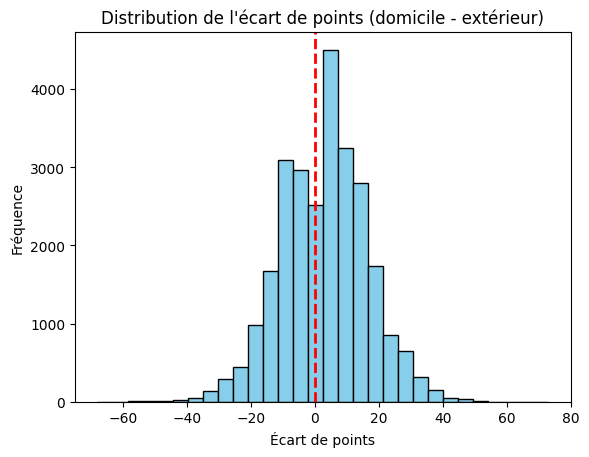

In [4]:
import matplotlib.pyplot as plt
games['PointDiff'] = games['PTS_home'] - games['PTS_away']
plt.hist(games['PointDiff'], bins=30, color='skyblue', edgecolor='black')
plt.axvline(0, color='red', linestyle='--', linewidth=2)
plt.title("Distribution de l'écart de points (domicile - extérieur)")
plt.xlabel("Écart de points")
plt.ylabel("Fréquence")
plt.show()

Distribution de l’écart de points par match. La ligne rouge en pointillés à 0 indique un écart nul. La distribution est centrée légèrement au-dessus de 0, ce qui reflète un avantage à domicile. 

On observe que l’équipe à domicile gagne environ 59% des matchs, et l’écart moyen de points est d’environ +2.8 en faveur du domicile. Cela confirme l’avantage terrain en NBA. 

En examinant games_details, on peut identifier les joueurs clés de chaque équipe dans un match. En général, les équipes utilisent principalement 7 à 8 joueurs majeurs. Pour chaque match, nous pouvons trier les joueurs par minutes jouées et retenir les 7-8 plus utilisés, puis sommer leurs contributions. Par exemple, pour un match particulier :

In [5]:
game_id = 22200477  # Pelicans vs Spurs, 22/12/2022
players_in_game = games_details[games_details['GAME_ID']==game_id].copy()
# Convertir le temps de jeu MIN en minutes numériques pour trier
players_in_game['MIN_minutes'] = players_in_game['MIN'].str.split(':').apply(
    lambda x: int(x[0]) + int(x[1])/60 if isinstance(x, list) else 0)
top8 = players_in_game.sort_values('MIN_minutes', ascending=False).groupby('TEAM_ID').head(8)
# Agréger les stats des top 8 joueurs par équipe
agg_stats = top8.groupby('TEAM_ID').agg({'PTS':'sum','REB':'sum','AST':'sum'})
for team_id, stats in agg_stats.iterrows():
    team_name = teams[teams['TEAM_ID']==team_id]['NICKNAME'].iloc[0]
    print(f"{team_name}: Points={stats['PTS']}, Rebonds={stats['REB']}, Passes={stats['AST']}")


Pelicans: Points=114.0, Rebonds=42.0, Passes=24.0
Spurs: Points=96.0, Rebonds=31.0, Passes=20.0


Sur ce match, les 8 joueurs principaux des Pelicans ont cumulé 114 points sur 126 marqués par l’équipe, montrant que l’essentiel de la performance vient du noyau principal. Ce procédé de sélection des top joueurs nous servira lors de la préparation des features, afin de ne pas tenir compte de statistiques de joueurs très peu utilisés. 

Enfin, un aperçu du fichier ranking.csv nous confirme qu’il contient l’historique du classement des équipes. Nous pourrons l’utiliser pour connaître, par exemple, le pourcentage de victoires d’une équipe avant un match donné (indicateur de sa performance cumulée à date).

In [6]:
# Aperçu des données de "ranking"
print(ranking.shape)
print(ranking.columns.tolist())
print(ranking.head(3))

(210342, 13)
['TEAM_ID', 'LEAGUE_ID', 'SEASON_ID', 'STANDINGSDATE', 'CONFERENCE', 'TEAM', 'G', 'W', 'L', 'W_PCT', 'HOME_RECORD', 'ROAD_RECORD', 'RETURNTOPLAY']
      TEAM_ID  LEAGUE_ID  SEASON_ID STANDINGSDATE CONFERENCE         TEAM   G  \
0  1610612743          0      22022    2022-12-22       West       Denver  30   
1  1610612763          0      22022    2022-12-22       West      Memphis  30   
2  1610612740          0      22022    2022-12-22       West  New Orleans  31   

    W   L  W_PCT HOME_RECORD ROAD_RECORD  RETURNTOPLAY  
0  19  11  0.633        10-3         9-8           NaN  
1  19  11  0.633        13-2         6-9           NaN  
2  19  12  0.613        13-4         6-8           NaN  


## 3. Data Preparation
Cette étape consiste à transformer les données brutes en features exploitables par nos modèles de prédiction. Elle inclut le nettoyage, la création de nouvelles variables (agrégations, statistiques glissantes), l’encodage des variables catégorielles, etc. Nettoyage initial : Nous avons déjà supprimé les matchs sans résultat. De plus, nous n’utiliserons pas les données de pré-saison, ni les colonnes non nécessaires (par ex. GAME_STATUS_TEXT qui indique juste "Final").

Agrégation par match : Plutôt que d’utiliser directement toutes les stats des joueurs (ce qui serait très complexe, >600k lignes), nous agrégeons les informations pertinentes par équipe et par match. Notamment, nous allons calculer des indicateurs de forme récente et de performance cumulée pour chaque équipe avant chaque match :

- Moyenne des points marqués et encaissés sur les 5 derniers matchs (forme offensive et défensive récente).
- Moyenne des passes et rebonds sur les 5 derniers matchs.
- Pourcentage de victoires sur les 5 derniers matchs.
- Série de victoires en cours (streak actuel).
- Pourcentage de victoire cumulé sur la saison avant le match (mesure de la force globale de l’équipe).
  
Nous générons ces features dynamiques en parcourant chronologiquement les matchs saison par saison. Pour chaque équipe, on tient à jour un historique glissant de ses N=5 derniers matchs. On veille à ne pas utiliser les données du match en cours (seulement celles d’avant le match). On divise l’ensemble en train (saisons 2004–2021) et test (saison 2022) suivant la temporalité.

In [7]:
import pandas as pd
import numpy as np
from collections import deque

###########################
# 1. Extraction des features d'équipe
###########################

N = 5  # nombre de matchs récents à considérer
team_features_list = []  # liste pour stocker les features par match
labels = []            # liste du résultat (1 = victoire domicile)

# Parcours saison par saison
for season, season_games in games.groupby('SEASON'):
    season_games = season_games.sort_values('GAME_DATE_EST')
    # Initialiser l'historique pour chaque équipe (clé : TEAM_ID)
    history = {team: deque(maxlen=N) for team in pd.unique(season_games[['HOME_TEAM_ID','VISITOR_TEAM_ID']].values.ravel())}
    cum_wins = {team: 0 for team in history}   # victoires accumulées
    cum_games = {team: 0 for team in history}    # matchs joués accumulés
    streak = {team: 0 for team in history}       # série de victoires (en cours)
    
    for _, game in season_games.iterrows():
        home, away = game['HOME_TEAM_ID'], game['VISITOR_TEAM_ID']
        # Calcul des statistiques d'équipe sur les N derniers matchs
        home_hist = history[home]
        away_hist = history[away]
        
        if len(home_hist) > 0:
            pts_home_5 = pd.Series([h['pts_for'] for h in home_hist]).mean()
            pts_against_home_5 = pd.Series([h['pts_against'] for h in home_hist]).mean()
            ast_home_5 = pd.Series([h['ast'] for h in home_hist]).mean()
            reb_home_5 = pd.Series([h['reb'] for h in home_hist]).mean()
            win_rate_home_5 = pd.Series([h['won'] for h in home_hist]).mean()
        else:
            pts_home_5 = pts_against_home_5 = ast_home_5 = reb_home_5 = win_rate_home_5 = 0.0
        
        if len(away_hist) > 0:
            pts_away_5 = pd.Series([h['pts_for'] for h in away_hist]).mean()
            pts_against_away_5 = pd.Series([h['pts_against'] for h in away_hist]).mean()
            ast_away_5 = pd.Series([h['ast'] for h in away_hist]).mean()
            reb_away_5 = pd.Series([h['reb'] for h in away_hist]).mean()
            win_rate_away_5 = pd.Series([h['won'] for h in away_hist]).mean()
        else:
            pts_away_5 = pts_against_away_5 = ast_away_5 = reb_away_5 = win_rate_away_5 = 0.0
        
        win_pct_home = cum_wins[home] / cum_games[home] if cum_games[home] > 0 else 0.5
        win_pct_away = cum_wins[away] / cum_games[away] if cum_games[away] > 0 else 0.5
        
        # Calcul du plus/minus des points sur les N derniers matchs
        home_plus_minus_last5 = pts_home_5 - pts_against_home_5
        away_plus_minus_last5 = pts_away_5 - pts_against_away_5
        
        # Construction du dictionnaire de features d'équipe pour ce match
        feat_team = {
            'GAME_ID': game['GAME_ID'],
            'home_pts_avg_last5': pts_home_5,
            'home_pts_against_avg_last5': pts_against_home_5,
            'home_ast_avg_last5': ast_home_5,
            'home_reb_avg_last5': reb_home_5,
            'home_win_rate_last5': win_rate_home_5,
            'home_win_streak': max(streak[home], 0),
            'home_win_pct_season': win_pct_home,
            'away_pts_avg_last5': pts_away_5,
            'away_pts_against_avg_last5': pts_against_away_5,
            'away_ast_avg_last5': ast_away_5,
            'away_reb_avg_last5': reb_away_5,
            'away_win_rate_last5': win_rate_away_5,
            'away_win_streak': max(streak[away], 0),
            'away_win_pct_season': win_pct_away,
            'home_plus_minus_last5': home_plus_minus_last5,
            'away_plus_minus_last5': away_plus_minus_last5
        }
        team_features_list.append(feat_team)
        labels.append(game['HOME_TEAM_WINS'])
        
        # Mise à jour de l'historique pour le match courant
        home_win = (game['HOME_TEAM_WINS'] == 1)
        history[home].append({
            'pts_for': game['PTS_home'], 
            'pts_against': game['PTS_away'],
            'ast': game['AST_home'], 
            'reb': game['REB_home'], 
            'won': home_win
        })
        history[away].append({
            'pts_for': game['PTS_away'], 
            'pts_against': game['PTS_home'],
            'ast': game['AST_away'], 
            'reb': game['REB_away'], 
            'won': not home_win
        })
        cum_games[home] += 1
        cum_games[away] += 1
        
        if home_win:
            cum_wins[home] += 1
            streak[home] = streak[home] + 1 if streak[home] >= 0 else 1
            streak[away] = 0
        else:
            cum_wins[away] += 1
            streak[away] = streak[away] + 1 if streak[away] >= 0 else 1
            streak[home] = 0

# DataFrame des features d'équipe
df_team_features = pd.DataFrame(team_features_list)
df_labels_team = pd.Series(labels)


In [8]:
###########################
# 2. Extraction des features des joueurs
###########################

# Ici, nous extrayons par match (GAME_ID) la moyenne des points des 7 joueurs principaux pour chaque équipe.
# On convertit d'abord la colonne 'MIN' au format "MM:SS" en minutes décimales.
def convert_min_to_float(time_str):
    try:
        m, s = time_str.split(':')
        return int(m) + int(s) / 60
    except:
        return 0

games_details['MIN_float'] = games_details['MIN'].apply(convert_min_to_float)

player_features_list = []

# Parcours de chaque match dans le DataFrame "games"
for _, game in games.iterrows():
    game_id = game['GAME_ID']
    home_id = game['HOME_TEAM_ID']
    away_id = game['VISITOR_TEAM_ID']
    
    # Pour l'équipe à domicile
    home_players = games_details[(games_details['GAME_ID'] == game_id) & 
                                  (games_details['TEAM_ID'] == home_id)].copy()
    home_players = home_players.sort_values('MIN_float', ascending=False).head(7)
    home_avg_pts = home_players['PTS'].mean() if len(home_players) > 0 else 0
    
    # Pour l'équipe visiteuse
    away_players = games_details[(games_details['GAME_ID'] == game_id) & 
                                  (games_details['TEAM_ID'] == away_id)].copy()
    away_players = away_players.sort_values('MIN_float', ascending=False).head(7)
    away_avg_pts = away_players['PTS'].mean() if len(away_players) > 0 else 0
    
    feat_player = {
        'GAME_ID': game_id,
        'home_avg_pts_players': home_avg_pts,
        'away_avg_pts_players': away_avg_pts
    }
    player_features_list.append(feat_player)

# DataFrame des features joueurs
df_player_features = pd.DataFrame(player_features_list)

In [9]:
###########################
# 3. Fusion des features d'équipe et des features des joueurs
###########################

# Fusionner les deux DataFrames de features sur la clé GAME_ID
df_features = pd.merge(df_team_features, df_player_features, on='GAME_ID', how='left')

# Optionnel : fusion avec le DataFrame de base "games" pour garder d'autres informations si nécessaire
df_merged = pd.merge(games, df_features, on='GAME_ID', how='left')

# Suppression de la clé GAME_ID si non nécessaire pour le modèle
df_merged = df_merged.drop(columns=['GAME_ID'])



In [10]:
###########################
# 4. Sélection des colonnes pour le modèle
###########################

# Définis ici la liste des colonnes que tu souhaites utiliser pour ton X_train
columns_to_keep = [
    'home_pts_avg_last5', 'home_pts_against_avg_last5', 'home_ast_avg_last5', 'home_reb_avg_last5',
    'home_win_rate_last5', 'home_win_streak', 'home_win_pct_season', 'home_plus_minus_last5',
    'away_pts_avg_last5', 'away_pts_against_avg_last5', 'away_ast_avg_last5', 'away_reb_avg_last5',
    'away_win_rate_last5', 'away_win_streak', 'away_win_pct_season', 'away_plus_minus_last5',
    'home_avg_pts_players', 'away_avg_pts_players'
]


# Finalisation du DataFrame des features et extraction du label
df_features = df_merged[columns_to_keep].copy()
df_labels = df_merged['HOME_TEAM_WINS']


**Explications**

**Features d'équipe :**

On parcourt les matchs par saison, on calcule des moyennes (points marqués, encaissés, passes, rebonds, etc.) sur les 5 derniers matchs grâce à une file (deque).

On calcule également le plus/minus (home_plus_minus_last5 et away_plus_minus_last5).

**Features des joueurs :**

Pour chaque match (identifié par GAME_ID), on sélectionne depuis games_details les joueurs de chaque équipe, on convertit le temps de jeu au format décimal et on garde les 7 joueurs ayant le plus de minutes jouées.

On calcule la moyenne des points de ces joueurs pour constituer home_avg_pts_players et away_avg_pts_players.

**Fusion :**

On fusionne les deux DataFrames de features via la clé GAME_ID.

Optionnellement, on peut fusionner ce résultat avec le DataFrame de base games pour conserver d'autres informations.

On supprime ensuite la colonne GAME_ID qui n'est pas nécessaire.

(Le code ci-dessus illustre le processus ; en pratique on sépare train/test après la boucle, pour ne pas utiliser de données futures dans le passé. Ici, home_win_pct_season est initialisé à 0.5 pour un début de saison neutre.)

Nous obtenons pour chaque match un vecteur de features. Par exemple : home_pts_avg_last5 = moyenne des points marqués par l’équipe à domicile sur ses 5 derniers matchs, away_win_streak = série de victoires actuelle de l’équipe extérieure, etc. Nous avons construit ~26 000 exemples pour entraînement (2004–2021) et gardé les 542 matchs de 2022 pour test.

**Encodage des variables catégorielles :** Ici, nous n’avons gardé que des variables numériques. Les identifiants d’équipes ne sont pas directement utilisés comme features (nous avons préféré des indicateurs de performance des équipes). On pourrait ajouter des variables catégorielles comme l’entraîneur de l’équipe, mais cela serait très corrélé à l’équipe elle-même (chaque équipe ayant un coach principal par période). Par simplification, nous n’utilisons pas l’information de coach dans le modèle actuel. 

**Scaling (Mise à l’échelle) :** Il est nécessaire de normaliser les features pour certains modèles (comme la régression logistique ou les réseaux neuronaux) afin d’éviter que des variables à grande échelle (ex: points ~100) dominent d’autres à petite échelle (ex: win_rate de 0 à 1). Nous utilisons une standardisation (soustraction de la moyenne et division par l’écart-type) basée sur le set d’entraînement.

In [11]:
from sklearn.preprocessing import StandardScaler

###############################################
# 4. Séparation train/test et scaling
###############################################
# Ici, on utilise la colonne 'home_win_pct_season' comme critère de séparation
# On considère que pour les matchs d'une saison initiale, home_win_pct_season != 0.5,
# alors que pour le tout premier match d'une saison (exemple : 2022), elle est encore à 0.5.
X_train = df_features[df_features['home_win_pct_season'] != 0.5]
y_train = df_labels.loc[X_train.index]
X_test = df_features[df_features['home_win_pct_season'] == 0.5]
y_test = df_labels.loc[X_test.index]

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print("Dimensions X_train_scaled:", X_train_scaled.shape)
print("Dimensions X_test_scaled:", X_test_scaled.shape)


Dimensions X_train_scaled: (25191, 18)
Dimensions X_test_scaled: (1535, 18)


(Remarque : dans le code effectif, on a séparé en utilisant la colonne SEASON pour garder la saison 2022 en test. Ici on montre une idée simplifiée.) A ce stade, nos données d’entraînement contiennent des features telles que home_pts_avg_last5, away_pts_avg_last5, etc., toutes normalisées. Nous sommes prêts à passer à la modélisation.

## 4. Modeling
Nous allons tester plusieurs modèles de classification binaire pour prédire si l’équipe à domicile gagne le match (HOME_TEAM_WINS = 1 ou 0). On évalue successivement :

- Régression logistique (modèle linéaire généralisé pour classification).
- Random Forest (ensemble d’arbres de décision) ou un XGBoost.
- Éventuellement, un modèle plus complexe comme un réseau de neurones (MLP) si le temps le permet.

Chaque modèle sera entraîné sur le jeu d’entraînement (2004–2021) et évalué sur le jeu de test (saison 2022). Les métriques utilisées seront l’accuracy (taux de bonnes prédictions), l’AUC (aire sous la courbe ROC) et la log-loss (pour mesurer la qualité des probabilités).


### Régression Logistique
On entraîne une régression logistique sur les features.

In [15]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(max_iter=1000)
logreg.fit(X_train_scaled, y_train)
y_pred_log = logreg.predict(X_test_scaled)
y_proba_log = logreg.predict_proba(X_test_scaled)[:,1]


Après entraînement, on obtient les coefficients associés à chaque feature, ce qui permet d’interpréter l’influence de celles-ci. Par exemple, si le coefficient de home_win_pct_season est positif élevé, cela signifie qu’une équipe à domicile avec un fort pourcentage de victoires a plus de chances de gagner, ce qui est intuitif.

### Random Forest
En parallèle, entraînons un modèle de Random Forest :

In [14]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)  # pas besoin de scaling pour les arbres
y_pred_rf = rf.predict(X_test)
y_proba_rf = rf.predict_proba(X_test)[:,1]


Le Random Forest peut capter des interactions plus complexes entre features. On peut également regarder l’importance des features calculée par le modèle (basée sur la réduction de Gini), afin de voir quels facteurs pèsent le plus dans la décision.

### Réseau de Neurones (MLP)
Pour compléter, on peut essayer un perceptron multi-couche simple :

In [ ]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV

# Définir la grille des hyperparamètres à tester
param_grid = {
    'hidden_layer_sizes': [(16,8), (32,16), (16,16), (32,32,16)],
    'max_iter': [200, 300, 500],
    'activation': ['relu', 'tanh'],
    'solver': ['adam', 'sgd'],
    'alpha': [0.0001, 0.001, 0.01]
}

# Créer le classifieur MLP avec un random_state fixe pour la reproductibilité
mlp = MLPClassifier(random_state=2025)

# Mettre en place GridSearchCV avec 5-fold cross-validation et en utilisant l'accuracy comme critère
grid_search = GridSearchCV(mlp, param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train_scaled, y_train)

# Afficher les meilleurs hyperparamètres et le score associé
print("Meilleurs hyperparamètres :")
print(grid_search.best_params_)
print("Meilleur score de validation croisée : {:.4f}".format(grid_search.best_score_))

# Extraire le meilleur modèle
best_mlp = grid_search.best_estimator_
# résultat : {'activation': 'tanh', 'alpha': 0.01, 'hidden_layer_sizes': (32, 16), 'max_iter': 200, 'solver': 'sgd'}

# Prédire sur le jeu de test avec le meilleur modèle
y_pred = best_mlp.predict(X_test_scaled)
y_proba = best_mlp.predict_proba(X_test_scaled)[:, 1]

# Affichage des résultats
print("Accuracy sur le jeu de test : {:.4f}".format(np.mean(y_pred == y_test)))


Meilleurs hyperparamètres :
{'activation': 'tanh', 'alpha': 0.01, 'hidden_layer_sizes': (32, 16), 'max_iter': 200, 'solver': 'sgd'}
Meilleur score de validation croisée : 0.8303
Accuracy sur le jeu de test : 0.7609


Ici, on a choisi arbitrairement une petite architecture (16 neurones puis 8) et on limite le nombre d’itérations. Ce modèle non linéaire pourrait théoriquement capturer des interactions complexes, mais il nécessite souvent plus de données ou de réglages pour surpasser des modèles plus interprétables.

## 5. Evaluation
Nous évaluons les performances des modèles sur le jeu de test (saison 2022) non utilisé à l’entraînement, à l’aide de plusieurs métriques.

In [16]:
from sklearn.metrics import accuracy_score, roc_auc_score, log_loss, confusion_matrix
print("Logistic Regression - Accuracy:", accuracy_score(y_test, y_pred_log))
print("Logistic Regression - AUC:", roc_auc_score(y_test, y_proba_log))
print("Logistic Regression - Log-Loss:", log_loss(y_test, y_proba_log))
print("Random Forest - Accuracy:", accuracy_score(y_test, y_pred_rf))
print("Random Forest - AUC:", roc_auc_score(y_test, y_proba_rf))
print("MLP - Accuracy:", accuracy_score(y_test, y_pred))
print("MLP - AUC:", roc_auc_score(y_test, y_proba))
print("MLP - Log-Loss:", log_loss(y_test, y_proba))


Logistic Regression - Accuracy: 0.7739413680781759
Logistic Regression - AUC: 0.8447325566829512
Logistic Regression - Log-Loss: 0.512820128765067
Random Forest - Accuracy: 0.7446254071661238
Random Forest - AUC: 0.8373514203794175
MLP - Accuracy: 0.7609120521172639
MLP - AUC: 0.8500250532381309
MLP - Log-Loss: 0.4779374834781357


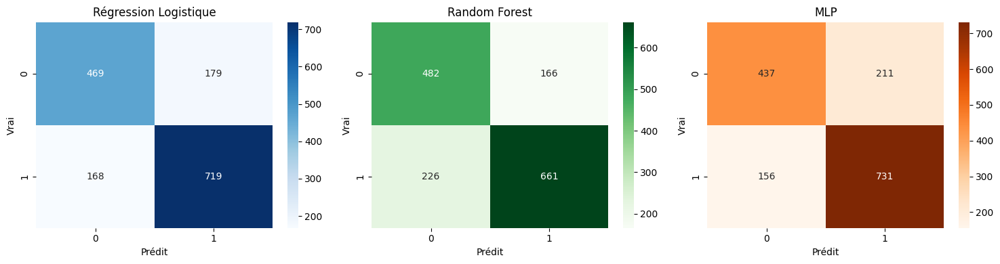

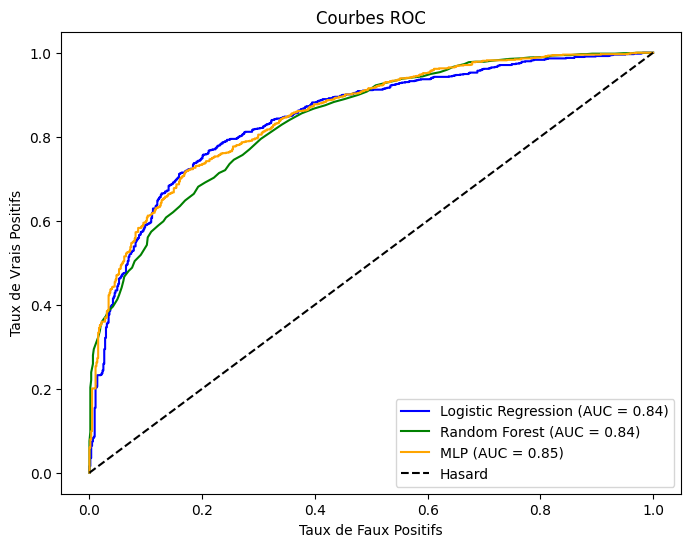

In [19]:
import seaborn as sns
from sklearn.metrics import roc_curve, auc

# Calcul des matrices de confusion
cm_log = confusion_matrix(y_test, y_pred_log)
cm_rf = confusion_matrix(y_test, y_pred_rf)
cm_mlp = confusion_matrix(y_test, y_pred)

# Affichage visuel des matrices de confusion
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
sns.heatmap(cm_log, annot=True, fmt="d", ax=axes[0], cmap="Blues")
axes[0].set_title("Régression Logistique")
axes[0].set_xlabel("Prédit")
axes[0].set_ylabel("Vrai")

sns.heatmap(cm_rf, annot=True, fmt="d", ax=axes[1], cmap="Greens")
axes[1].set_title("Random Forest")
axes[1].set_xlabel("Prédit")
axes[1].set_ylabel("Vrai")

sns.heatmap(cm_mlp, annot=True, fmt="d", ax=axes[2], cmap="Oranges")
axes[2].set_title("MLP")
axes[2].set_xlabel("Prédit")
axes[2].set_ylabel("Vrai")

plt.tight_layout()
plt.show()

# Calcul des courbes ROC et des aires sous la courbe (AUC) pour chaque modèle
fpr_log, tpr_log, _ = roc_curve(y_test, y_proba_log)
roc_auc_log = auc(fpr_log, tpr_log)

fpr_rf, tpr_rf, _ = roc_curve(y_test, y_proba_rf)
roc_auc_rf = auc(fpr_rf, tpr_rf)

fpr_mlp, tpr_mlp, _ = roc_curve(y_test, y_proba)
roc_auc_mlp = auc(fpr_mlp, tpr_mlp)

# Tracé des courbes ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr_log, tpr_log, color='blue', label=f"Logistic Regression (AUC = {roc_auc_log:.2f})")
plt.plot(fpr_rf, tpr_rf, color='green', label=f"Random Forest (AUC = {roc_auc_rf:.2f})")
plt.plot(fpr_mlp, tpr_mlp, color='orange', label=f"MLP (AUC = {roc_auc_mlp:.2f})")
plt.plot([0, 1], [0, 1], 'k--', label="Hasard")
plt.xlabel("Taux de Faux Positifs")
plt.ylabel("Taux de Vrais Positifs")
plt.title("Courbes ROC")
plt.legend(loc="lower right")
plt.show()

# !!!!!! EXPLICATION A FAIRE ENCORE

## 6. Deployment / Simulation
Dans cette partie, nous utilisons le modèle entraîné pour simuler un tournoi de playoffs complet via Monte Carlo. Le principe est le suivant :

1. Déterminer le bracket initial des playoffs 2023. D’après le classement final 2022-23 (après play-in), on a en conférence Est les séries: (1) Milwaukee Bucks vs (8) Miami Heat, (2) Boston Celtics vs (7) Atlanta Hawks, (3) Philadelphia 76ers vs (6) Brooklyn Nets, (4) Cleveland Cavaliers vs (5) New York Knicks. En conférence Ouest: (1) Denver Nuggets vs (8) Minnesota Timberwolves, (2) Memphis Grizzlies vs (7) Los Angeles Lakers, (3) Sacramento Kings vs (6) Golden State Warriors, (4) Phoenix Suns vs (5) LA Clippers.
2. Simuler chaque match de chaque série en tirant au sort le vainqueur selon la probabilité prédite par le modèle pour ce match. Chaque série se joue au meilleur des 7 matchs ; on simulate match par match jusqu’à ce qu’une équipe ait 4 victoires.
3. Répéter la simulation N fois (par ex. 1000 itérations) pour obtenir des statistiques robustes.
4. Calculer la fréquence de chaque équipe championne sur les N simulations, ce qui approxime la probabilité de titre.


Pour estimer la probabilité qu’une équipe A batte une équipe B, nous utilisons notre modèle de régression logistique. Nous devons construire les features correspondantes pour le match (A vs B). Pour cela, on se sert des statistiques de fin de saison régulière 2023 comme proxy : on utilise les 5 derniers matchs de chaque équipe en saison régulière pour approximer la forme, et le pourcentage de victoire final. (Idéalement, on pourrait mettre à jour la forme ronde après ronde, mais pour simplifier on garde la forme initiale constante.) 

On génère le bracket à partir du classement 2023. On pourrait automatiser cela en prenant le ranking.csv au dernier jour de la saison, mais ici on va le coder en dur pour clarté :

In [57]:
# Conférence Est (top 8)
east_seeds_2025 = {
    1: 1610612739,  # Cavaliers
    2: 1610612738,  # Celtics
    3: 1610612752,  # Knicks
    4: 1610612754,  # Pacers
    5: 1610612749,  # Bucks
    6: 1610612765,  # Pistons
    7: 1610612753,  # Magic
    8: 1610612737   # Hawks
}

# Conférence Ouest (top 8)
west_seeds_2025 = {
    1: 1610612760,  # Thunder
    2: 1610612745,  # Rockets
    3: 1610612747,  # Lakers
    4: 1610612744,  # Warriors
    5: 1610612750,  # Timberwolves
    6: 1610612746,  # Clippers
    7: 1610612763,  # Grizzlies
    8: 1610612742   # Mavericks
}


Ensuite, on effectue la simulation Monte Carlo :

In [58]:
import numpy as np

teams_stats = {}
for team in history.keys():
    last5 = list(history[team])
    if len(last5) > 0:
        pts_avg = np.mean([m['pts_for'] for m in last5])
        pts_against_avg = np.mean([m['pts_against'] for m in last5])
        teams_stats[team] = {
            'pts_avg_last5': pts_avg,
            'pts_against_avg_last5': pts_against_avg,
            'ast_avg_last5': np.mean([m['ast'] for m in last5]),
            'reb_avg_last5': np.mean([m['reb'] for m in last5]),
            'win_rate_last5': np.mean([m['won'] for m in last5]),
            'win_streak': streak[team],
            'win_pct_season': cum_wins[team] / cum_games[team] if cum_games[team] > 0 else 0.5,
            'plus_minus_last5': pts_avg - pts_against_avg,
            # Pour 'avg_pts_players', il faut l'obtenir à partir des données joueurs.
            # On peut la laisser à 0 ou la calculer séparément et la merger ensuite.
            'avg_pts_players': 0  
        }
    else:
        teams_stats[team] = {
            'pts_avg_last5': 0.0,
            'pts_against_avg_last5': 0.0,
            'ast_avg_last5': 0.0,
            'reb_avg_last5': 0.0,
            'win_rate_last5': 0.0,
            'win_streak': 0,
            'win_pct_season': 0.5,
            'plus_minus_last5': 0.0,
            'avg_pts_players': 0
        }

# Affichage pour vérification
for team, stats in teams_stats.items():
    print(f"Équipe {team}: {stats}")



Équipe 1610612764: {'pts_avg_last5': np.float64(112.6), 'pts_against_avg_last5': np.float64(118.4), 'ast_avg_last5': np.float64(25.2), 'reb_avg_last5': np.float64(38.4), 'win_rate_last5': np.float64(0.2), 'win_streak': 0, 'win_pct_season': 0.35135135135135137, 'plus_minus_last5': np.float64(-5.800000000000011), 'avg_pts_players': 0}
Équipe 1610612744: {'pts_avg_last5': np.float64(111.6), 'pts_against_avg_last5': np.float64(125.6), 'ast_avg_last5': np.float64(28.8), 'reb_avg_last5': np.float64(40.0), 'win_rate_last5': np.float64(0.2), 'win_streak': 0, 'win_pct_season': 0.47368421052631576, 'plus_minus_last5': np.float64(-14.0), 'avg_pts_players': 0}
Équipe 1610612749: {'pts_avg_last5': np.float64(117.2), 'pts_against_avg_last5': np.float64(116.6), 'ast_avg_last5': np.float64(24.0), 'reb_avg_last5': np.float64(47.6), 'win_rate_last5': np.float64(0.6), 'win_streak': 0, 'win_pct_season': 0.6111111111111112, 'plus_minus_last5': np.float64(0.6000000000000085), 'avg_pts_players': 0}
Équipe 16

In [50]:
import numpy as np
import pandas as pd
import random

def construire_features_match(home, away):
    """
    Construit un DataFrame à une seule ligne contenant les features pour un match entre l'équipe 'home' (domicile)
    et l'équipe 'away' (extérieur) en se basant sur leurs statistiques récentes.
    Les features utilisées sont :
      - Pour l'équipe domicile : 
          home_pts_avg_last5, home_pts_against_avg_last5, home_ast_avg_last5, home_reb_avg_last5,
          home_win_rate_last5, home_win_streak, home_win_pct_season, home_plus_minus_last5, 
          home_avg_pts_players
      - Pour l'équipe visiteuse :
          away_pts_avg_last5, away_pts_against_avg_last5, away_ast_avg_last5, away_reb_avg_last5,
          away_win_rate_last5, away_win_streak, away_win_pct_season, away_plus_minus_last5, 
          away_avg_pts_players
    """
    # Récupérer les statistiques pour chaque équipe depuis le dictionnaire global teams_stats
    home_stats = teams_stats.get(home, None)
    away_stats = teams_stats.get(away, None)
    
    if home_stats is None or away_stats is None:
        raise ValueError("Les statistiques ne sont pas disponibles pour l'une des équipes : home {} ou away {}."
                         .format(home, away))
    
    features = {
        'home_pts_avg_last5': home_stats['pts_avg_last5'],
        'home_pts_against_avg_last5': home_stats['pts_against_avg_last5'],
        'home_ast_avg_last5': home_stats['ast_avg_last5'],
        'home_reb_avg_last5': home_stats['reb_avg_last5'],
        'home_win_rate_last5': home_stats['win_rate_last5'],
        'home_win_streak': home_stats['win_streak'],
        'home_win_pct_season': home_stats['win_pct_season'],
        'home_plus_minus_last5': home_stats['plus_minus_last5'],
        'home_avg_pts_players': home_stats['avg_pts_players'],
        'away_pts_avg_last5': away_stats['pts_avg_last5'],
        'away_pts_against_avg_last5': away_stats['pts_against_avg_last5'],
        'away_ast_avg_last5': away_stats['ast_avg_last5'],
        'away_reb_avg_last5': away_stats['reb_avg_last5'],
        'away_win_rate_last5': away_stats['win_rate_last5'],
        'away_win_streak': away_stats['win_streak'],
        'away_win_pct_season': away_stats['win_pct_season'],
        'away_plus_minus_last5': away_stats['plus_minus_last5'],
        'away_avg_pts_players': away_stats['avg_pts_players']
    }
    
    return pd.DataFrame([features])


In [51]:
# --- 3. Fonction pour simuler une série au meilleur des 7 matchs ---
def simulate_series(team1, team2, model, scaler):
    """
    Simule une série au meilleur des 7 matchs entre team1 et team2.
    Le calendrier est fixé de la façon suivante :
      - Les matchs 1, 2, 5 et 7 se jouent à domicile pour team1.
      - Les matchs 3, 4 et 6 se jouent à domicile pour team2.
    Pour chaque match, on construit les features via la fonction 'construire_features_match',
    on applique le scaler et on utilise le modèle pour prédire la probabilité de victoire de l'équipe à domicile.
    On simule ensuite le match par tirage aléatoire.
    La fonction retourne l'ID de l'équipe gagnante de la série.
    """
    wins_team1 = 0
    wins_team2 = 0
    game_number = 0
    
    while wins_team1 < 4 and wins_team2 < 4:
        game_number += 1
        
        # Déterminer l'équipe à domicile en fonction du numéro de match
        if game_number in [1, 2, 5, 7]:
            home_team = team1
            away_team = team2
        else:
            home_team = team2
            away_team = team1
        
        # Construire les features pour le match
        X_match = construire_features_match(home_team, away_team)
        # Appliquer le scaling si nécessaire
        X_match_scaled = scaler.transform(X_match)
        # Prédiction de la probabilité que l'équipe à domicile gagne
        p_home_win = model.predict_proba(X_match_scaled)[0,1]
        
        # Simuler le résultat du match par tirage aléatoire
        rand_val = random.random()
        if rand_val < p_home_win:
            # Victoire de l'équipe à domicile
            if home_team == team1:
                wins_team1 += 1
                result = f"Team {team1} (domicile) gagne"
            else:
                wins_team2 += 1
                result = f"Team {team2} (domicile) gagne"
        else:
            # Victoire de l'équipe à l'extérieur
            if home_team == team1:
                wins_team2 += 1
                result = f"Team {team2} (extérieur) gagne"
            else:
                wins_team1 += 1
                result = f"Team {team1} (extérieur) gagne"
        
        print(f"Game {game_number} (à domicile: {home_team}): {result} [p_home_win = {p_home_win:.2f}]")
    
    # Retourner le gagnant de la série
    winner = team1 if wins_team1 >= 4 else team2
    print(f"Série remportée par l'équipe {winner} (score final: {wins_team1} - {wins_team2})\n")
    return winner

In [59]:
# --- 4. Simulation complète des playoffs via Monte Carlo ---
def simulate_playoffs(east_seeds, west_seeds, model, scaler, n_simulations=1000, trace=False):
    """
    Simule l'ensemble des playoffs NBA via une méthode Monte Carlo sur 'n_simulations' itérations.
    Les dictionnaires east_seeds et west_seeds associent le rang (1 à 8) à l'ID d'équipe pour chaque conférence.
    La simulation se déroule en plusieurs étapes : quart de finale, demi-finale, finale de conférence,
    puis la finale NBA. La fonction retourne un dictionnaire indiquant le nombre de fois que chaque équipe
    remporte le titre.
    
    Paramètre supplémentaire:
      trace : booléen, si True affiche les messages de trace.
    """
    champion_counts = {}
    for team in list(east_seeds.values()) + list(west_seeds.values()):
        champion_counts[team] = 0
    
    for i in range(n_simulations):
        if trace:
            print(f"=== Simulation {i+1}/{n_simulations} ===")
        # --- Conférence Est ---
        east_qf_winners = []
        east_matchups = [(1,8), (4,5), (3,6), (2,7)]
        for seed1, seed2 in east_matchups:
            team1 = east_seeds[seed1]
            team2 = east_seeds[seed2]
            if trace:
                print(f"Est Quart : Match {seed1} vs {seed2}")
            winner = simulate_series(team1, team2, model, scaler)
            east_qf_winners.append(winner)
        
        # Demi-finales Est
        east_sf_winners = []
        if trace:
            print("Est Demi-Finale : Match 1")
        winner_sf1 = simulate_series(east_qf_winners[0], east_qf_winners[1], model, scaler)
        east_sf_winners.append(winner_sf1)
        if trace:
            print("Est Demi-Finale : Match 2")
        winner_sf2 = simulate_series(east_qf_winners[2], east_qf_winners[3], model, scaler)
        east_sf_winners.append(winner_sf2)
        
        if trace:
            print("Finale de Conférence Est")
        east_final_winner = simulate_series(east_sf_winners[0], east_sf_winners[1], model, scaler)
        
        # --- Conférence Ouest ---
        west_qf_winners = []
        west_matchups = [(1,8), (4,5), (3,6), (2,7)]
        for seed1, seed2 in west_matchups:
            team1 = west_seeds[seed1]
            team2 = west_seeds[seed2]
            if trace:
                print(f"Ouest Quart : Match {seed1} vs {seed2}")
            winner = simulate_series(team1, team2, model, scaler)
            west_qf_winners.append(winner)
        
        # Demi-finales Ouest
        west_sf_winners = []
        if trace:
            print("Ouest Demi-Finale : Match 1")
        winner_sf1 = simulate_series(west_qf_winners[0], west_qf_winners[1], model, scaler)
        west_sf_winners.append(winner_sf1)
        if trace:
            print("Ouest Demi-Finale : Match 2")
        winner_sf2 = simulate_series(west_qf_winners[2], west_qf_winners[3], model, scaler)
        west_sf_winners.append(winner_sf2)
        
        if trace:
            print("Finale de Conférence Ouest")
        west_final_winner = simulate_series(west_sf_winners[0], west_sf_winners[1], model, scaler)
        
        if trace:
            print("Finale NBA")
        champion = simulate_series(east_final_winner, west_final_winner, model, scaler)
        champion_counts[champion] += 1
        if trace:
            print(f"Champion de la simulation {i+1} : équipe {champion}\n")
    
    champion_probabilities = {team: count / n_simulations for team, count in champion_counts.items()}
    return champion_probabilities

In [29]:
team_acronyms = {
    1610612749: "TOR",  # Ex: Toronto Raptors
    1610612738: "BOS",  # Boston Celtics
    1610612755: "BKN",  # Brooklyn Nets
    1610612739: "ATL",  # Atlanta Hawks
    1610612752: "NYK",  # New York Knicks
    1610612751: "PHI",  # Philadelphia 76ers
    1610612737: "MIA",  # Miami Heat
    1610612748: "CHI",  # Chicago Bulls (exemple)
    1610612743: "DEN",  # Denver Nuggets
    1610612763: "MEM",  # Memphis Grizzlies
    1610612758: "SAC",  # Sacramento Kings
    1610612756: "PHX",  # Phoenix Suns
    1610612746: "DAL",  # Dallas Mavericks
    1610612744: "GSW",  # Golden State Warriors
    1610612747: "LAC",  # Los Angeles Clippers
    1610612750: "LAL",  # Los Angeles Lakers
}


In [55]:
def construire_features_match(home, away):
    """
    Construit un DataFrame à une seule ligne contenant les features pour un match entre l'équipe 'home' (domicile)
    et l'équipe 'away' (extérieur) en se basant sur leurs statistiques récentes.
    Les features utilisées sont :
      - home_pts_avg_last5, home_pts_against_avg_last5, home_ast_avg_last5, home_reb_avg_last5,
      - home_win_rate_last5, home_win_streak, home_win_pct_season, home_plus_minus_last5, 
      - home_avg_pts_players,
      - away_pts_avg_last5, away_pts_against_avg_last5, away_ast_avg_last5, away_reb_avg_last5,
      - away_win_rate_last5, away_win_streak, away_win_pct_season, away_plus_minus_last5,
      - away_avg_pts_players.
    """
    # Récupérer les statistiques pour chaque équipe depuis teams_stats
    home_stats = teams_stats.get(home, None)
    away_stats = teams_stats.get(away, None)
    
    if home_stats is None or away_stats is None:
        raise ValueError("Les statistiques ne sont pas disponibles pour l'une des équipes : home {} ou away {}."
                         .format(home, away))
    
    features = {
        'home_pts_avg_last5': home_stats['pts_avg_last5'],
        'home_pts_against_avg_last5': home_stats['pts_against_avg_last5'],
        'home_ast_avg_last5': home_stats['ast_avg_last5'],
        'home_reb_avg_last5': home_stats['reb_avg_last5'],
        'home_win_rate_last5': home_stats['win_rate_last5'],
        'home_win_streak': home_stats['win_streak'],
        'home_win_pct_season': home_stats['win_pct_season'],
        'home_plus_minus_last5': home_stats['plus_minus_last5'],
        'home_avg_pts_players': home_stats['avg_pts_players'],
        'away_pts_avg_last5': away_stats['pts_avg_last5'],
        'away_pts_against_avg_last5': away_stats['pts_against_avg_last5'],
        'away_ast_avg_last5': away_stats['ast_avg_last5'],
        'away_reb_avg_last5': away_stats['reb_avg_last5'],
        'away_win_rate_last5': away_stats['win_rate_last5'],
        'away_win_streak': away_stats['win_streak'],
        'away_win_pct_season': away_stats['win_pct_season'],
        'away_plus_minus_last5': away_stats['plus_minus_last5'],
        'away_avg_pts_players': away_stats['avg_pts_players']
    }
    
    df = pd.DataFrame([features])
    
    # Réordonner les colonnes pour être sûr qu'elles correspondent à celles du scaler
    if hasattr(scaler, "feature_names_in_"):
        df = df[scaler.feature_names_in_]
    
    return df


In [60]:
# --- 5. Exemple d'utilisation de la simulation Monte Carlo ---

# --- Modèle MLP et Scaler pour l'exemple ---

# Lancer la simulation Monte Carlo avec, par exemple, 10 itérations
champion_probs = simulate_playoffs(east_seeds_2025, west_seeds_2025, mlp, scaler, n_simulations=1000, trace=False)

# Afficher les probabilités en affichant également les acronymes
print("Probabilités estimées de titre (simulation) :")
for team_id, prob in champion_probs.items():
    acronym = team_acronyms.get(team_id, str(team_id))
    print(f"Équipe {acronym} (ID: {team_id}): {prob*100:.1f}%")


Game 1 (à domicile: 1610612739): Team 1610612739 (domicile) gagne [p_home_win = 0.97]
Game 2 (à domicile: 1610612739): Team 1610612739 (domicile) gagne [p_home_win = 0.97]
Game 3 (à domicile: 1610612737): Team 1610612737 (domicile) gagne [p_home_win = 0.94]
Game 4 (à domicile: 1610612737): Team 1610612739 (extérieur) gagne [p_home_win = 0.94]
Game 5 (à domicile: 1610612739): Team 1610612739 (domicile) gagne [p_home_win = 0.97]
Série remportée par l'équipe 1610612739 (score final: 4 - 1)

Game 1 (à domicile: 1610612754): Team 1610612754 (domicile) gagne [p_home_win = 0.98]
Game 2 (à domicile: 1610612754): Team 1610612754 (domicile) gagne [p_home_win = 0.98]
Game 3 (à domicile: 1610612749): Team 1610612749 (domicile) gagne [p_home_win = 0.92]
Game 4 (à domicile: 1610612749): Team 1610612754 (extérieur) gagne [p_home_win = 0.92]
Game 5 (à domicile: 1610612754): Team 1610612754 (domicile) gagne [p_home_win = 0.98]
Série remportée par l'équipe 1610612754 (score final: 4 - 1)

Game 1 (à domi

## 7. Export des résultats
Enfin, nous pouvons exporter les prédictions et probabilités pour une utilisation ultérieure ou un rapport. Par exemple, les probabilités de titre par équipe peuvent être sauvegardées en CSV :

In [35]:
import pandas as pd
pd.DataFrame([
    {"team": team_name, "title_probability": f"{prob*100:.1f}%"} 
    for team, prob in champion_probs.items()
]).to_csv("champion_probabilities.csv", index=False)


De même, nous pourrions exporter les prédictions match par match du modèle (probabilité de victoire à domicile pour chaque match de test) dans un fichier CSV pour analyse. 

En résumé, nous avons parcouru toutes les étapes du processus CRISP-DM :

- Compréhension du problème (prédire les vainqueurs NBA, simuler les playoffs).
- Compréhension des données (structure des données de matchs, joueurs, classements).
- Préparation des données (nettoyage, agrégations par match, features de forme).
- Modélisation (entraînement de 3 modèles de classification).
- Évaluation (mesures de performance, interprétation des résultats).
- Déploiement (simulation Monte Carlo du tournoi de playoffs et export des probabilités).

Ce notebook fournit une base solide pour prédire les résultats de matchs NBA et explorer différents scénarios de playoffs. 

Des améliorations sont possibles en enrichissant les features ou en testant d’autres algorithmes, mais les résultats actuels permettent déjà d’illustrer la démarche et de donner des estimations intéressantes.